## Section 1 - Introduction
Tourism sees on annual basis almost 27.5m tourist. An attractive destination for all types of tourist offering loads of attractions, parks, music and event.

- Tourist spend on aveverage 6.5B dollars

- 6.4B dollars in hotels booking

- An overall impact of 10.3B dollar.

- Accomodation, food, drink and performing arts contribute 70% of all tourism activities

#### Objective
The execise is to try and identify a location / zone to establish a Turkish restaurant around Ontario, Toronto, targeting tourist & business customers.

#### Location:
Scarborough is known for its diverse cultural landscape and proximity to tourist locations.

#### Foursquare API:
Primary data source for this exercise will be sourced from Four Square. Which will cover the 4 main categories accomodation, food, drink and performance arts

## Section 2 - Data Section 

To be able to determine the ideal location for opening a Turkish restaurant, i will explore the area for various types of venues and compare them with respect to business zone and tourist attractions. capturing venue name, location, venue categories. The data collected will then be used to create hot zones and identify the best zone for an investment. List of data to be collected from Foursquare would include but not limited to ( in addition to the data already sourced from wikipedia and geo

- Venue Name

- Venue location (Longitude / Latitude)

- Venue Category (targeting: accomodation, food, drink and arts mainly)

- Neighbhourhood name

- Neighborhood location (Longitute / Latitude)

- volume of traffic at the venue (if available)

- volume of recommendation (if available)

data source:
 1. Data on Toronto - https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M
 2. Geolocation data - https://cocl.us/Geospatial_data
 3. Venue data - www.foursquare.com

In [1]:
!pip install geocoder
!pip install geopy
!pip install folium

In [2]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import numpy as np
import geocoder
import folium
import requests 
import json 
import matplotlib.cm as cm
import matplotlib.colors as colors

from pandas.io.json import json_normalize 
from sklearn.cluster import KMeans
from geopy.geocoders import Nominatim 

In [3]:
url = "https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M"
url_text = requests.get(url).text
data = BeautifulSoup(url_text, 'lxml')

In [4]:
all_tables=data.find_all("table")
all_tables

[<table class="wikitable sortable">
 <tbody><tr>
 <th>Postal Code
 </th>
 <th>Borough
 </th>
 <th>Neighbourhood
 </th></tr>
 <tr>
 <td>M1A
 </td>
 <td>Not assigned
 </td>
 <td>Not assigned
 </td></tr>
 <tr>
 <td>M2A
 </td>
 <td>Not assigned
 </td>
 <td>Not assigned
 </td></tr>
 <tr>
 <td>M3A
 </td>
 <td>North York
 </td>
 <td>Parkwoods
 </td></tr>
 <tr>
 <td>M4A
 </td>
 <td>North York
 </td>
 <td>Victoria Village
 </td></tr>
 <tr>
 <td>M5A
 </td>
 <td>Downtown Toronto
 </td>
 <td>Regent Park, Harbourfront
 </td></tr>
 <tr>
 <td>M6A
 </td>
 <td>North York
 </td>
 <td>Lawrence Manor, Lawrence Heights
 </td></tr>
 <tr>
 <td>M7A
 </td>
 <td>Downtown Toronto
 </td>
 <td>Queen's Park, Ontario Provincial Government
 </td></tr>
 <tr>
 <td>M8A
 </td>
 <td>Not assigned
 </td>
 <td>Not assigned
 </td></tr>
 <tr>
 <td>M9A
 </td>
 <td>Etobicoke
 </td>
 <td>Islington Avenue, Humber Valley Village
 </td></tr>
 <tr>
 <td>M1B
 </td>
 <td>Scarborough
 </td>
 <td>Malvern, Rouge
 </td></tr>
 <tr>
 <td>M2B

In [5]:
right_table = data.find('table', class_= 'wikitable sortable')
right_table

<table class="wikitable sortable">
<tbody><tr>
<th>Postal Code
</th>
<th>Borough
</th>
<th>Neighbourhood
</th></tr>
<tr>
<td>M1A
</td>
<td>Not assigned
</td>
<td>Not assigned
</td></tr>
<tr>
<td>M2A
</td>
<td>Not assigned
</td>
<td>Not assigned
</td></tr>
<tr>
<td>M3A
</td>
<td>North York
</td>
<td>Parkwoods
</td></tr>
<tr>
<td>M4A
</td>
<td>North York
</td>
<td>Victoria Village
</td></tr>
<tr>
<td>M5A
</td>
<td>Downtown Toronto
</td>
<td>Regent Park, Harbourfront
</td></tr>
<tr>
<td>M6A
</td>
<td>North York
</td>
<td>Lawrence Manor, Lawrence Heights
</td></tr>
<tr>
<td>M7A
</td>
<td>Downtown Toronto
</td>
<td>Queen's Park, Ontario Provincial Government
</td></tr>
<tr>
<td>M8A
</td>
<td>Not assigned
</td>
<td>Not assigned
</td></tr>
<tr>
<td>M9A
</td>
<td>Etobicoke
</td>
<td>Islington Avenue, Humber Valley Village
</td></tr>
<tr>
<td>M1B
</td>
<td>Scarborough
</td>
<td>Malvern, Rouge
</td></tr>
<tr>
<td>M2B
</td>
<td>Not assigned
</td>
<td>Not assigned
</td></tr>
<tr>
<td>M3B
</td>
<td

In [6]:
column = ['Postalcode','Borough','Neighborhood']
df_tr = pd.DataFrame(columns = column)

In [7]:
pc=0
bh=0
nh=0

for tr in right_table.find_all('tr'):
    i = 0
    for td in tr.find_all('td'):
        if i == 0:
            pc = td.text.strip('\n').replace(']','')
            i = i + 1
        elif i == 1:
            bh = td.text.strip('\n').replace(']','')
            i = i + 1
        elif i == 2: 
            nh = td.text.strip('\n').replace(']','')
    df_tr = df_tr.append({'Postalcode': pc,'Borough': bh,'Neighborhood': nh},ignore_index=True)

In [8]:
# clean dataframe 
df_tr = df_tr[df_tr.Borough!='Not assigned']
df_tr = df_tr[df_tr.Borough!= 0]
df_tr.reset_index(drop = True, inplace = True)
i = 0
for i in range(0,df_tr.shape[0]):
    if df_tr.iloc[i][2] == 'Not assigned':
        df_tr.iloc[i][2] = df_tr.iloc[i][1]
        i = i+1

In [9]:
df_tr.describe()

,Postalcode,Borough,Neighborhood
count,103,103,103
unique,103,10,99
top,M1N,North York,Downsview
freq,1,24,4


In [10]:
df = df_tr.groupby(['Postalcode','Borough'])['Neighborhood'].apply(','.join).reset_index()
df

,Postalcode,Borough,Neighborhood
0,M1B,Scarborough,"Malvern, Rouge"
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek"
2,M1E,Scarborough,"Guildwood, Morningside, West Hill"
3,M1G,Scarborough,Woburn
4,M1H,Scarborough,Cedarbrae
...,...,...,...
98,M9N,York,Weston
99,M9P,Etobicoke,Westmount
100,M9R,Etobicoke,"Kingsview Village, St. Phillips, Martin Grove ..."
101,M9V,Etobicoke,"South Steeles, Silverstone, Humbergate, Jamest..."


In [11]:
#Getting Lattitude and Longitude 
def get_latilong(postal_code):
    lat_lng_coords = None
    while(lat_lng_coords is None):
        g = geocoder.arcgis('{}, Toronto, Ontario'.format(postal_code))
        lat_lng_coords = g.latlng
    return lat_lng_coords

In [12]:
#Getting Postal Code Coordinates
postal_codes = df['Postalcode']    
coords = [ get_latilong(postal_code) for postal_code in postal_codes.tolist() ]

In [13]:
#Adding Columns Latitude & Longitude
df_coords = pd.DataFrame(coords, columns=['Latitude', 'Longitude'])
df['Latitude'] = df_coords['Latitude']
df['Longitude'] = df_coords['Longitude']

In [14]:
#sizing dataframe and Toronto areas 
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(df['Borough'].unique()),
        df.shape[0]
    )
)

The dataframe has 10 boroughs and 103 neighborhoods.


In [15]:
# Getting Address of Toronto using geopy
address = 'Toronto, Ontario Canada'
geolocator = Nominatim(user_agent="texplorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('Toronto, Ontario Latitude,', latitude,' Longitute', longitude)

Toronto, Ontario Latitude, 43.6534817  Longitute -79.3839347


In [16]:
#Create Map of Toronto with neighbourhood super imposed
map_toronto = folium.Map(location=[latitude, longitude], zoom_start=10)

# add neighbourhood to map
for lat, lng, borough, df_t in zip(df['Latitude'], df['Longitude'], df['Borough'], df['Neighborhood']):
    label = '{}, {}'.format(df, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)  
    
map_toronto

In [17]:
#Foursquare Authentication 
CLIENT_ID = 'XVZMLO2HXEOGUJ4WG5JHDVFRHQYKGVSS53EI4OQKHI0PYVDV' # your Foursquare ID
CLIENT_SECRET = 'BDONXHAKFJPZXEDZ222EVHNAUPMOYRHJ0VULYLBQMJRTRXE2' # your Foursquare Secret
ACCESS_TOKEN = 'RCUQPINCZMMS4FAYPSMKXC4UDRVSS4WOAIHGJGNF45DELV5B' # your FourSquare Access Token
VERSION = '20180604'
LIMIT = 500
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)


Your credentails:
CLIENT_ID: XVZMLO2HXEOGUJ4WG5JHDVFRHQYKGVSS53EI4OQKHI0PYVDV
CLIENT_SECRET:BDONXHAKFJPZXEDZ222EVHNAUPMOYRHJ0VULYLBQMJRTRXE2


In [18]:
#Getting all close by venues 

def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [19]:
borough_toronto = df
borough_toronto.head()

,Postalcode,Borough,Neighborhood,Latitude,Longitude
0,M1B,Scarborough,"Malvern, Rouge",43.81139,-79.19662
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek",43.78574,-79.15875
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.76575,-79.17470
3,M1G,Scarborough,Woburn,43.76812,-79.21761
4,M1H,Scarborough,Cedarbrae,43.76944,-79.23892


In [20]:
borough_toronto_venues = getNearbyVenues(names=borough_toronto['Neighborhood'],
                                   latitudes=borough_toronto['Latitude'],
                                   longitudes=borough_toronto['Longitude'])

Malvern, Rouge
Rouge Hill, Port Union, Highland Creek
Guildwood, Morningside, West Hill
Woburn
Cedarbrae
Scarborough Village
Kennedy Park, Ionview, East Birchmount Park
Golden Mile, Clairlea, Oakridge
Cliffside, Cliffcrest, Scarborough Village West
Birch Cliff, Cliffside West
Dorset Park, Wexford Heights, Scarborough Town Centre
Wexford, Maryvale
Agincourt
Clarks Corners, Tam O'Shanter, Sullivan
Milliken, Agincourt North, Steeles East, L'Amoreaux East
Steeles West, L'Amoreaux West
Upper Rouge
Hillcrest Village
Fairview, Henry Farm, Oriole
Bayview Village
York Mills, Silver Hills
Willowdale, Newtonbrook
Willowdale, Willowdale East
York Mills West
Willowdale, Willowdale West
Parkwoods
Don Mills
Don Mills
Bathurst Manor, Wilson Heights, Downsview North
Northwood Park, York University
Downsview
Downsview
Downsview
Downsview
Victoria Village
Parkview Hill, Woodbine Gardens
Woodbine Heights
The Beaches
Leaside
Thorncliffe Park
East Toronto, Broadview North (Old East York)
The Danforth West, 

In [21]:
print(borough_toronto_venues.shape)
borough_toronto_venues.head()

(2377, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Malvern, Rouge",43.81139,-79.19662,Wendy’s,43.807448,-79.199056,Fast Food Restaurant
1,"Rouge Hill, Port Union, Highland Creek",43.78574,-79.15875,Great Shine Window Cleaning,43.783145,-79.157431,Home Service
2,"Rouge Hill, Port Union, Highland Creek",43.78574,-79.15875,Royal Canadian Legion,43.782533,-79.163085,Bar
3,"Guildwood, Morningside, West Hill",43.76575,-79.17470,The Strawberry Patch,43.764738,-79.173081,Tea Room
4,"Guildwood, Morningside, West Hill",43.76575,-79.17470,Homestead Roofing Repair,43.765140,-79.178663,Construction & Landscaping


In [22]:
#grouped=borough_toronto_venues.groupby('Neighborhood').count()

In [23]:

#grouped.sort_values(by=['Venue Category'], inplace=True, ascending=False)
#grouped

In [24]:
print('There are {} uniques categories.'.format(len(borough_toronto_venues['Venue Category'].unique())))
print('There are {} uniques Neighborhoods.'.format(len(borough_toronto_venues['Neighborhood'].unique())))

There are 260 uniques categories.
There are 96 uniques Neighborhoods.


In [25]:
borough_toronto_venues['Venue Category'].unique()
#borough_toronto_venues['Venue Category'].count()

array(['Fast Food Restaurant', 'Home Service', 'Bar', 'Tea Room',
       'Construction & Landscaping', 'Gym / Fitness Center', 'Park',
       'Coffee Shop', 'Business Service', 'Gaming Cafe',
       'Indian Restaurant', 'Grocery Store', 'Restaurant', 'Spa',
       'Department Store', 'Discount Store', 'Hobby Shop',
       'Convenience Store', 'Soccer Field', 'Intersection', 'Bus Line',
       'Metro Station', 'Bakery', 'Ice Cream Shop', 'Pharmacy',
       'Pizza Place', 'Sandwich Place', 'Liquor Store', 'Café',
       'General Entertainment', 'Skating Rink', 'College Stadium',
       'Gift Shop', 'Light Rail Station', 'Auto Garage', 'Supermarket',
       'Chinese Restaurant', 'Sushi Restaurant', 'Shopping Mall',
       'Badminton Court', 'Newsagent', 'Bubble Tea Shop',
       'Hong Kong Restaurant', 'Cantonese Restaurant', 'Bank',
       'Golf Course', 'Deli / Bodega', 'Video Game Store', 'Bus Stop',
       'Electronics Store', 'Gym', 'Other Great Outdoors',
       'Residential Buildin

## Section 3 - Methodology 
Now that I have the data structured and identified venue data by neighborhood using Foursquare. 

- Total of 96 Neighborhoods
- Containing 260 uniques Venue Categories

I will now examine the neighborhoods and identify the number of Turkish restaurants per neighborhood.

I will  achieve this by clustering  venue category in each neighborhood. I will then proceed to determine the optimal clusters, accordingly proceed to determine the spread of the clusters based neighborhoods across toronto. 

After having determined the clusters, i will propose based on cluster density, cluster size and number of restaurants the ideal cluster to focus on to establish the turkish restaurant


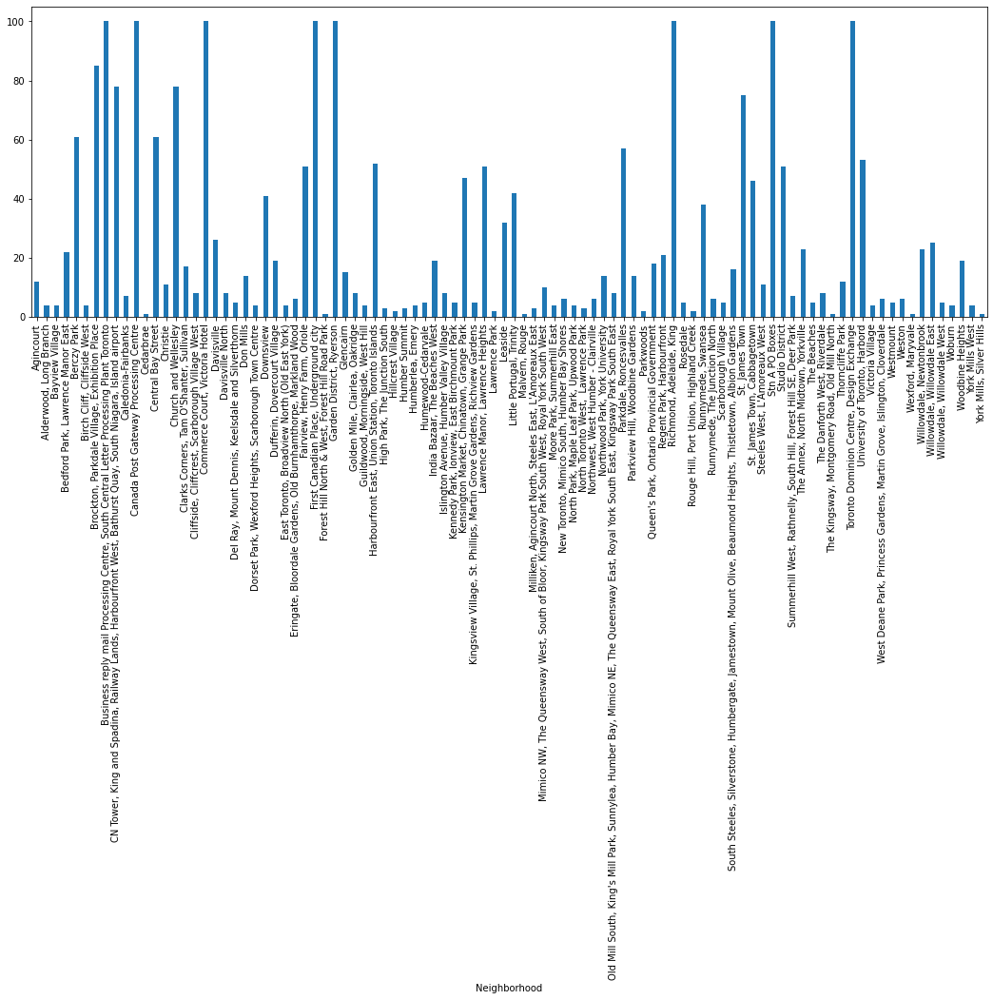

In [26]:
# plot to show number of venues per neighborhood 
df_venue_cat = borough_toronto_venues.groupby(['Neighborhood'], sort=True)['Venue Category'].count()
df_venue_cat.plot.bar(figsize=(18,6))

In [27]:
#check if venues include Turkish and Fast food restaurants
print ("Venue Category contains Fast food outlets = ","Fast Food Restaurant" in borough_toronto_venues['Venue Category'].unique())
print ("Venue Category contains Turkish Restaurant = ","Turkish Restaurant" in borough_toronto_venues['Venue Category'].unique())

Venue Category contains Fast food outlets =  True
Venue Category contains Turkish Restaurant =  True


In [28]:
# Create Column flaging all restaurants as Fast Food Restaurants
borough_toronto_venues['Venue Fast Food Restaurant'] =np.nan
borough_toronto_venues['Venue Fast Food Restaurant'][borough_toronto_venues['Venue Category'].str.contains("Restaurant")] = "Fast Food Restaurant"


/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


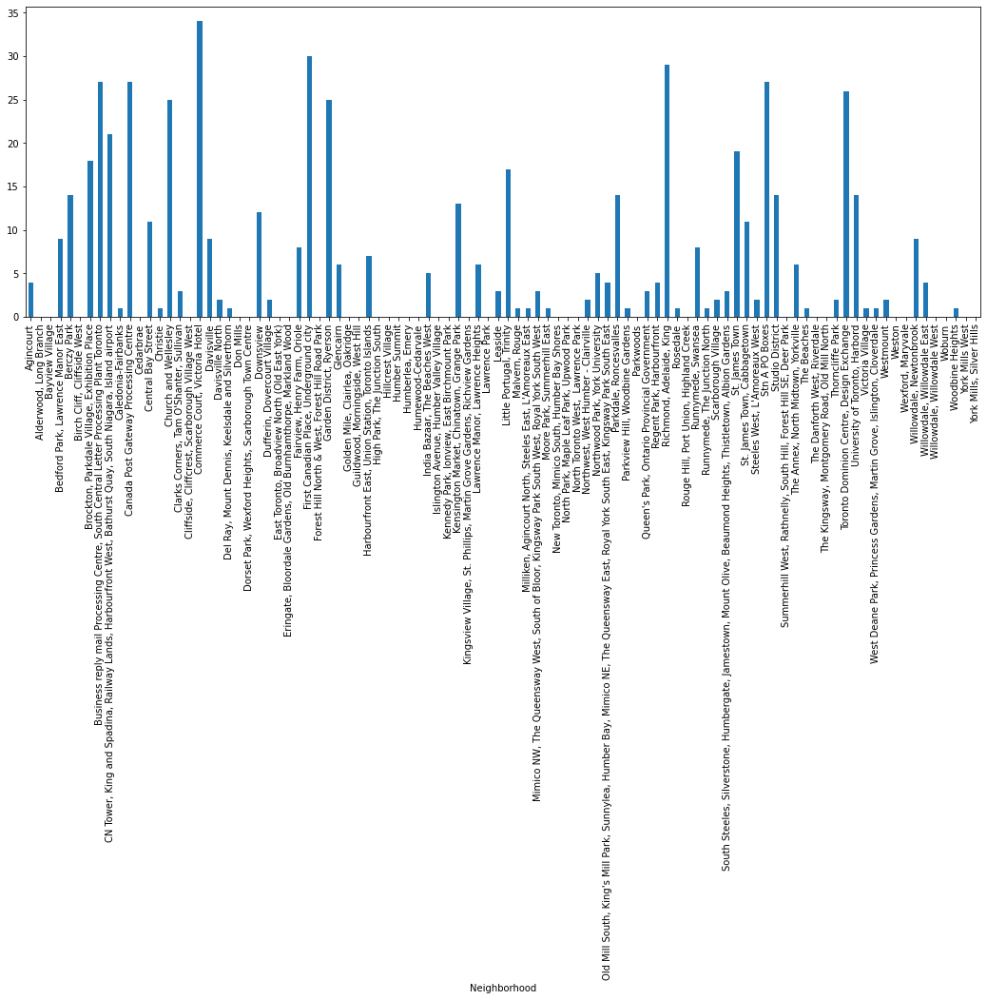

In [29]:
# Plot to see number of Fast Food outlets per neighborhood 
df_venue_cat_turk = borough_toronto_venues.groupby(['Neighborhood'], sort=True)['Venue Fast Food Restaurant'] .count()
df_venue_cat_turk.plot.bar(figsize=(18,6))

In [30]:
#Creating column containing just Turkish restaurants 
borough_toronto_venues['Venue Turk Restaurant'] =np.nan
borough_toronto_venues['Venue Turk Restaurant'][borough_toronto_venues['Venue Category'].str.contains("Turkish Restaurant")] = "Turkish Restaurant"

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


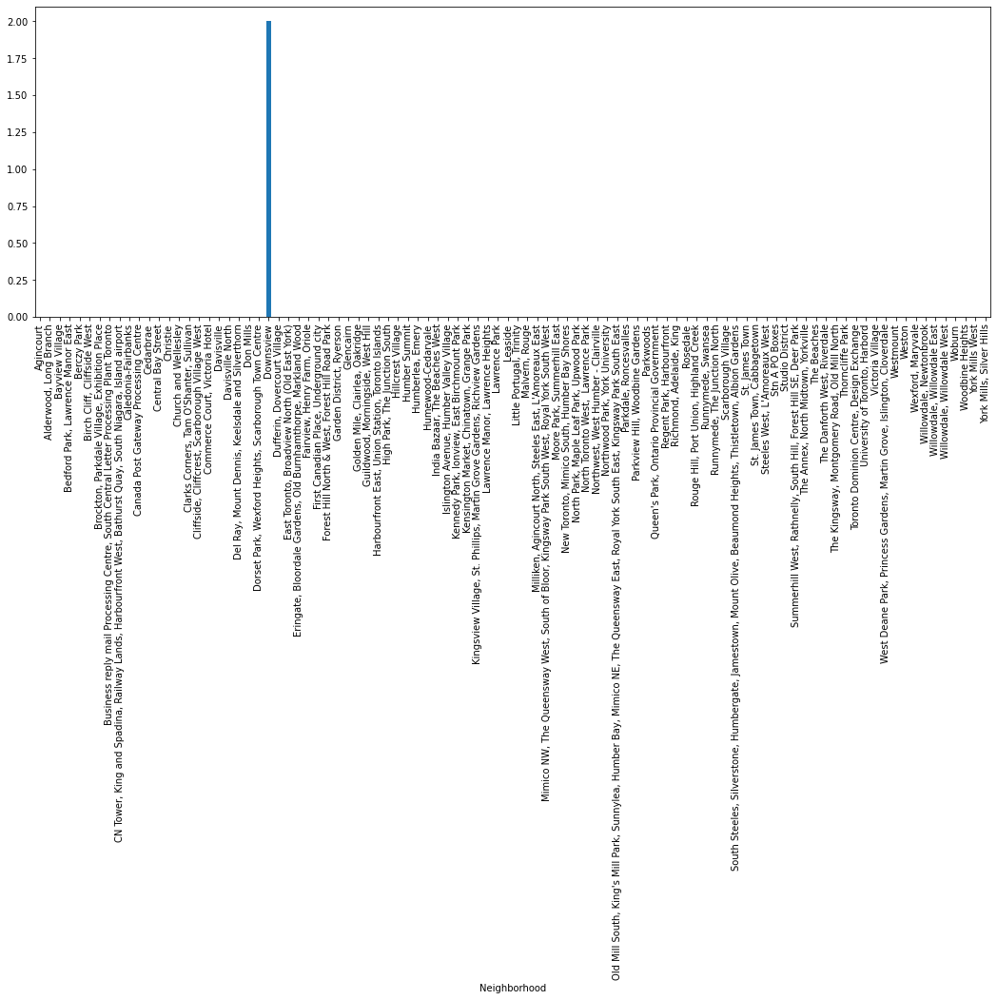

In [31]:
# Plotting numnber of Turkish restaurants per neighborhood
df_venue_cat_turk = borough_toronto_venues.groupby(['Neighborhood'], sort=True)['Venue Turk Restaurant'] .count()
df_venue_cat_turk.plot.bar(figsize=(18,6))

#### Having seen that the number of Turkish restaurants is just 2 across all of toronto, this poses as a good opportunity to open a new outlets. As the data is insufficient to determine a good locations, we will work with all types of restaurants to determine a hot spot for establishment 


## Analyzing Neighborhood

In [32]:
toronto_onehot = pd.get_dummies(borough_toronto_venues[['Venue Category']], prefix="", prefix_sep="")

toronto_onehot['Neighborhood'] = borough_toronto_venues['Neighborhood'] 

fixed_columns = [toronto_onehot.columns[-1]] + list(toronto_onehot.columns[:-1])
toronto_onehot = toronto_onehot[fixed_columns]

toronto_onehot.head()

,Yoga Studio,ATM,Accessories Store,Adult Boutique,American Restaurant,Antique Shop,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,...,Trail,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Wine Bar,Wings Joint,Women's Store
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [33]:
toronto_onehot.shape

(2377, 260)

In [34]:
toronto_grouped = toronto_onehot.groupby('Neighborhood').mean().reset_index()
toronto_grouped
print(toronto_grouped.shape)
toronto_grouped.head()

(96, 260)


,Neighborhood,Yoga Studio,ATM,Accessories Store,Adult Boutique,American Restaurant,Antique Shop,Aquarium,Art Gallery,Art Museum,...,Trail,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Wine Bar,Wings Joint,Women's Store
0,Agincourt,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,"Alderwood, Long Branch",0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,Bayview Village,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,...,0.5,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
3,"Bedford Park, Lawrence Manor East",0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
4,Berczy Park,0.016393,0.0,0.0,0.0,0.0,0.016393,0.0,0.016393,0.0,...,0.0,0.0,0.0,0.016393,0.0,0.0,0.0,0.0,0.0,0.0


In [35]:
tur_FF = toronto_grouped[["Neighborhood","Restaurant"]]
tur_FF.head(35)

,Neighborhood,Restaurant
0,Agincourt,0.000000
1,"Alderwood, Long Branch",0.000000
2,Bayview Village,0.000000
3,"Bedford Park, Lawrence Manor East",0.045455
4,Berczy Park,0.032787
5,"Birch Cliff, Cliffside West",0.000000
6,"Brockton, Parkdale Village, Exhibition Place",0.047059
7,"Business reply mail Processing Centre, South C...",0.020000
8,"CN Tower, King and Spadina, Railway Lands, Har...",0.025641
9,Caledonia-Fairbanks,0.000000


## Clustering Neighborhoods

In [36]:
km = KMeans(n_clusters=3, init='k-means++', max_iter=100, n_init=1, 
  verbose=True)
x= tur_FF.drop(['Neighborhood'], axis=1)

In [37]:
km.fit(x)
km.labels_[0:10]

Initialization complete
Iteration 0, inertia 0.01870413506029337
Iteration 1, inertia 0.012187911686160005
Iteration 2, inertia 0.011818754898979147
Iteration 3, inertia 0.011789071698195897
Converged at iteration 3: center shift 0.0 within tolerance 1.609069665649738e-07


array([0, 0, 0, 2, 2, 0, 2, 0, 2, 0], dtype=int32)

In [38]:
def get_inertia(n_clusters):
    km = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=15, random_state=8)
    km.fit(x)
    return km.inertia_

In [39]:
scores = [get_inertia(x) for x in range(2, 21)]

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

Text(0, 0.5, 'Error')

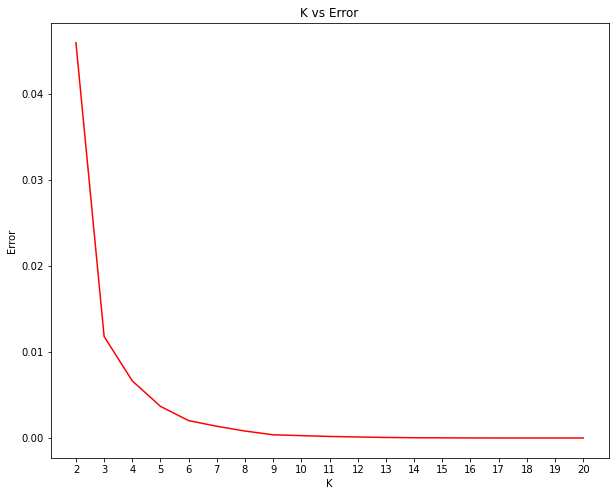

In [41]:
plt.figure(figsize=[10, 8])
sns.lineplot(x=range(2, 21), y=scores, color='r')
plt.title("K vs Error")
plt.xticks(range(2, 21))
plt.xlabel("K")
plt.ylabel("Error")

In [42]:
kclusters = 3

kmeans = KMeans(n_clusters=kclusters, random_state=1).fit(x)
print(kmeans.labels_[0:10])
print(len(kmeans.labels_))

[2 2 2 0 0 2 0 2 0 2]
96


In [43]:
#merging top 10 venues in boroughs with the name toronto in it. 

toronto_merged = tur_FF.copy()
#toronto_merged = toronto_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

toronto_merged["Cluster Labels"] = kmeans.labels_

toronto_merged.head(50) # check the last columns!

,Neighborhood,Restaurant,Cluster Labels
0,Agincourt,0.000000,2
1,"Alderwood, Long Branch",0.000000,2
2,Bayview Village,0.000000,2
3,"Bedford Park, Lawrence Manor East",0.045455,0
4,Berczy Park,0.032787,0
5,"Birch Cliff, Cliffside West",0.000000,2
6,"Brockton, Parkdale Village, Exhibition Place",0.047059,0
7,"Business reply mail Processing Centre, South C...",0.020000,2
8,"CN Tower, King and Spadina, Railway Lands, Har...",0.025641,0
9,Caledonia-Fairbanks,0.000000,2


In [44]:
toronto_merged= toronto_merged.join(borough_toronto_venues.set_index("Neighborhood"), on="Neighborhood")

In [45]:
print(toronto_merged.shape)
toronto_merged.head()

(2377, 11)


,Neighborhood,Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Fast Food Restaurant,Venue Turk Restaurant
0,Agincourt,0.0,2,43.79452,-79.26708,Bestco Food Market 鴻華超級市場,43.796514,-79.270790,Supermarket,NaN,NaN
0,Agincourt,0.0,2,43.79452,-79.26708,Grandeur Palace 華丽宮 (Grandeur Palace 華麗宮),43.797885,-79.270585,Chinese Restaurant,Fast Food Restaurant,NaN
0,Agincourt,0.0,2,43.79452,-79.26708,Sushi Legend,43.796602,-79.270292,Sushi Restaurant,Fast Food Restaurant,NaN
0,Agincourt,0.0,2,43.79452,-79.26708,Aromaz Cake and Pastry 龍騰閣,43.797714,-79.270870,Bakery,NaN,NaN
0,Agincourt,0.0,2,43.79452,-79.26708,Commander Arena,43.794867,-79.267989,Skating Rink,NaN,NaN


In [46]:
print("Total Fast Food Restuarants = ",toronto_merged['Venue Category'].value_counts()['Fast Food Restaurant'])
print("Total Turkish Restuarants =",toronto_merged['Venue Category'].value_counts()['Turkish Restaurant'])

Total Fast Food Restuarants =  30
Total Turkish Restuarants = 2


Since the number of Turkish Restuarants is low, we will continue to determine location based on Fast food restaurant. 



In [47]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=13)

x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

markers_colors = []
for lat, lon, poi, cluster in zip(toronto_merged['Neighborhood Latitude'], toronto_merged['Neighborhood Longitude'], toronto_merged['Neighborhood'],toronto_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker([lat, lon], radius=5, popup=label, color=rainbow[cluster-1], fill=True, fill_color=rainbow[cluster-1], fill_opacity=0.7).add_to(map_clusters)
map_clusters

In [48]:
tur_FF["Cluster Labels"] = kmeans.labels_
tur_FF.head()

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


,Neighborhood,Restaurant,Cluster Labels
0,Agincourt,0.000000,2
1,"Alderwood, Long Branch",0.000000,2
2,Bayview Village,0.000000,2
3,"Bedford Park, Lawrence Manor East",0.045455,0
4,Berczy Park,0.032787,0


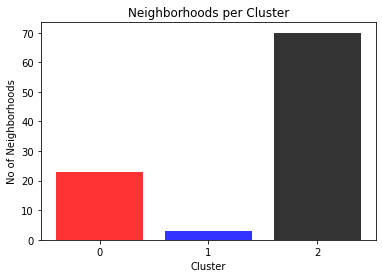

In [49]:
objects = (0,1,2)
y_pos = np.arange(len(objects))
performance = tur_FF['Cluster Labels'].value_counts().to_frame().sort_index(ascending=True)
perf = performance['Cluster Labels'].tolist()
plt.bar(y_pos, perf, align='center', alpha=0.8, color=['red', 'Blue','Black'])
plt.xticks(y_pos, objects)
plt.ylabel('No of Neighborhoods')
plt.xlabel('Cluster')
plt.title('Neighborhoods per Cluster')

plt.show()

1. cluster 1 seems too small and as per map is spread over a vast distansce 
2. cluster 2 consists of 70 neighborhoods and is spread well over toronto

accordingly lets explore cluster zero 

In [54]:
cls0 = toronto_merged.loc[toronto_merged['Cluster Labels'] == 0]
cls0

,Neighborhood,Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Fast Food Restaurant,Venue Turk Restaurant
3,"Bedford Park, Lawrence Manor East",0.045455,0,43.73545,-79.41916,Aroma Espresso Bar,43.735975,-79.420391,Café,NaN,NaN
3,"Bedford Park, Lawrence Manor East",0.045455,0,43.73545,-79.41916,The Copper Chimney,43.736195,-79.420271,Indian Restaurant,Fast Food Restaurant,NaN
3,"Bedford Park, Lawrence Manor East",0.045455,0,43.73545,-79.41916,Darbar Persian Grill,43.735484,-79.420006,Restaurant,Fast Food Restaurant,NaN
3,"Bedford Park, Lawrence Manor East",0.045455,0,43.73545,-79.41916,Pheasant & Firkin,43.735173,-79.419702,Pub,NaN,NaN
3,"Bedford Park, Lawrence Manor East",0.045455,0,43.73545,-79.41916,Karbouzi Greek Taverna,43.736204,-79.420359,Greek Restaurant,Fast Food Restaurant,NaN
...,...,...,...,...,...,...,...,...,...,...,...
83,"University of Toronto, Harbord",0.037736,0,43.66311,-79.40180,Kenzo Japanese Noodle House,43.666295,-79.406002,Ramen Restaurant,Fast Food Restaurant,NaN
83,"University of Toronto, Harbord",0.037736,0,43.66311,-79.40180,Al Green Theatre,43.666547,-79.404053,Concert Hall,NaN,NaN
83,"University of Toronto, Harbord",0.037736,0,43.66311,-79.40180,Shoppers Drug Mart,43.666562,-79.405007,Pharmacy,NaN,NaN
83,"University of Toronto, Harbord",0.037736,0,43.66311,-79.40180,Sushi Maido,43.666330,-79.405624,Sushi Restaurant,Fast Food Restaurant,NaN


In [56]:
df_cls0 = df[['Borough', 'Neighborhood']]
df_cls0.head()

,Borough,Neighborhood
0,Scarborough,"Malvern, Rouge"
1,Scarborough,"Rouge Hill, Port Union, Highland Creek"
2,Scarborough,"Guildwood, Morningside, West Hill"
3,Scarborough,Woburn
4,Scarborough,Cedarbrae


In [58]:
df_cluster0 = pd.merge(df_cls0, cls0, on='Neighborhood')
df_cluster0

,Borough,Neighborhood,Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Fast Food Restaurant,Venue Turk Restaurant
0,North York,"Fairview, Henry Farm, Oriole",0.039216,0,43.78097,-79.34781,The LEGO Store,43.778207,-79.343483,Toy / Game Store,NaN,NaN
1,North York,"Fairview, Henry Farm, Oriole",0.039216,0,43.78097,-79.34781,CF Fairview Mall,43.777981,-79.344397,Shopping Mall,NaN,NaN
2,North York,"Fairview, Henry Farm, Oriole",0.039216,0,43.78097,-79.34781,Fairview Library Theatre,43.779018,-79.346526,Theater,NaN,NaN
3,North York,"Fairview, Henry Farm, Oriole",0.039216,0,43.78097,-79.34781,Purdys Chocolatier,43.778160,-79.344154,Chocolate Shop,NaN,NaN
4,North York,"Fairview, Henry Farm, Oriole",0.039216,0,43.78097,-79.34781,Apple Fairview,43.777883,-79.343789,Electronics Store,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1305,West Toronto,"Runnymede, Swansea",0.026316,0,43.64982,-79.47548,System Fitness,43.652348,-79.471260,Gym,NaN,NaN
1306,West Toronto,"Runnymede, Swansea",0.026316,0,43.64982,-79.47548,High Park Soccer Fields,43.647788,-79.472995,Soccer Field,NaN,NaN
1307,West Toronto,"Runnymede, Swansea",0.026316,0,43.64982,-79.47548,Second Cup,43.650137,-79.480795,Café,NaN,NaN
1308,West Toronto,"Runnymede, Swansea",0.026316,0,43.64982,-79.47548,Swansea School of Dance,43.648077,-79.479005,Dance Studio,NaN,NaN


Borough
Central Toronto       9
Downtown Toronto    238
East Toronto          5
East York             3
North York           28
West Toronto         57
Name: Venue Fast Food Restaurant, dtype: int64


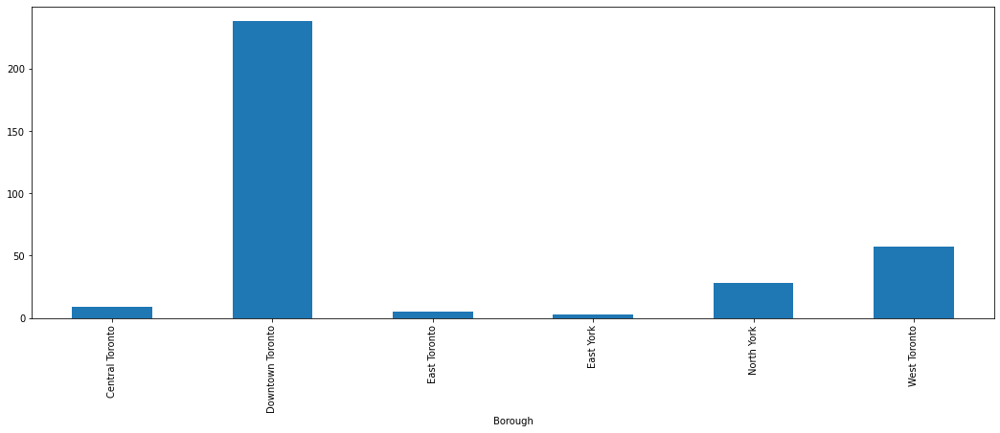

In [67]:
# Plot to see number of Fast Food outlets per neighborhood 
df_venue_cat_turk = df_cluster0.groupby(['Borough'], sort=True)['Venue Fast Food Restaurant'] .count()
print(df_cluster0.groupby(['Borough'], sort=True)['Venue Fast Food Restaurant'] .count())
df_venue_cat_turk.plot.bar(figsize=(18,6))

In [68]:
#Create Map of Toronto with cluster 0 
map_toronto = folium.Map(location=[latitude, longitude], zoom_start=10)

# add neighbourhood to map
for lat, lng, borough, df_t in zip(df_cluster0['Neighborhood Latitude'], df_cluster0['Neighborhood Longitude'], df_cluster0['Borough'], df_cluster0['Borough']):
    label = '{}, {}'.format(df, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)  
    
map_toronto

## Section 4 - Results

Objective of the exercise was to determine an area to start a new turkish restaurant. Cluster 0 mainly consisting of neighborhoods around downtown seems to be the ideal location. 

#### Justification 
- 238  Fast food restaurants are located in around down town in cluster 0
- No turkish restaurants located in the cluster. 
- On average each neighborhood contains 15 restaurants 
- Cluster contains a good mix of neighborhoods catering for business, tourism and Food.

## Section 5 - Discussion 

- Foursquare was the only source of venue data and could be limited, exercise could be continued with further inputs to determine if there are any other turkish restaurants in cluster 0
- additional tourism data can be integrated to determine number of turkish tourist/residents in Toronto to further enhance data model 


## Section 6 - Conclusion

Exercise was successfully completed based on factual data collected from various sources, using tools such as 
- beautiful soup
- Pandas
- numpy
- matplotlib
- Follium

using the tools I structured the data and used various graphs / clustering methodoligies to determine the best location for a turkish restaurant. I am confident based on the model created anyone who wishes to establish turkish restaurant in toronto downtown area will be successful in the venture. 

